In [64]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import BaggingRegressor,ExtraTreesRegressor,GradientBoostingRegressor,HistGradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from pandas.plotting import scatter_matrix
from sklearn.linear_model import LinearRegression, Lasso,LogisticRegression
from sklearn.metrics import f1_score,precision_score,accuracy_score,recall_score,confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import KFold,cross_val_score
from sklearn.metrics import mean_squared_error,r2_score
import pickle
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold

In [3]:
df=pd.read_excel('Agri_data_Combined.xlsx')

In [4]:
df.head()

,Country Name,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,GDP (US$),"Agriculture, forestry, and fishing, value added (% of GDP)","Population, total",Rural population (% of total population),"Labor force, total","Employment in agriculture, male (% of male employment)","Employment in agriculture, female (% of female employment)",Agricultural land (sq. km),Agricultural land (% of land area),Arable land (hectares per person),Fertilizer consumption (kilograms per hectare of arable land),Cereal yield (kg per hectare)
0,Albania,Maize,1990,36613,1485,121.00,16.37,2028553750.00,NaN,3286542,63.57,1374478,NaN,NaN,11210.00,40.91,0.18,176.17,2794.40
1,Albania,Potatoes,1990,66667,1485,121.00,16.37,2028553750.00,NaN,3286542,63.57,1374478,NaN,NaN,11210.00,40.91,0.18,176.17,2794.40
2,Albania,"Rice, paddy",1990,23333,1485,121.00,16.37,2028553750.00,NaN,3286542,63.57,1374478,NaN,NaN,11210.00,40.91,0.18,176.17,2794.40
3,Albania,Sorghum,1990,12500,1485,121.00,16.37,2028553750.00,NaN,3286542,63.57,1374478,NaN,NaN,11210.00,40.91,0.18,176.17,2794.40
4,Albania,Soybeans,1990,7000,1485,121.00,16.37,2028553750.00,NaN,3286542,63.57,1374478,NaN,NaN,11210.00,40.91,0.18,176.17,2794.40


Data size

In [5]:
df.shape

(27228, 19)

Column names

In [6]:
df.columns

Index(['Country Name', 'Item', 'Year', 'hg/ha_yield',
       'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp',
       'GDP (US$) ',
       'Agriculture, forestry, and fishing, value added (% of GDP) ',
       'Population, total ', 'Rural population (% of total population) ',
       'Labor force, total ',
       'Employment in agriculture, male (% of male employment) ',
       'Employment in agriculture, female (% of female employment) ',
       'Agricultural land (sq. km) ', 'Agricultural land (% of land area) ',
       'Arable land (hectares per person) ',
       'Fertilizer consumption (kilograms per hectare of arable land) ',
       'Cereal yield (kg per hectare) '],
      dtype='object')

Coorelation matrix

<Axes: >

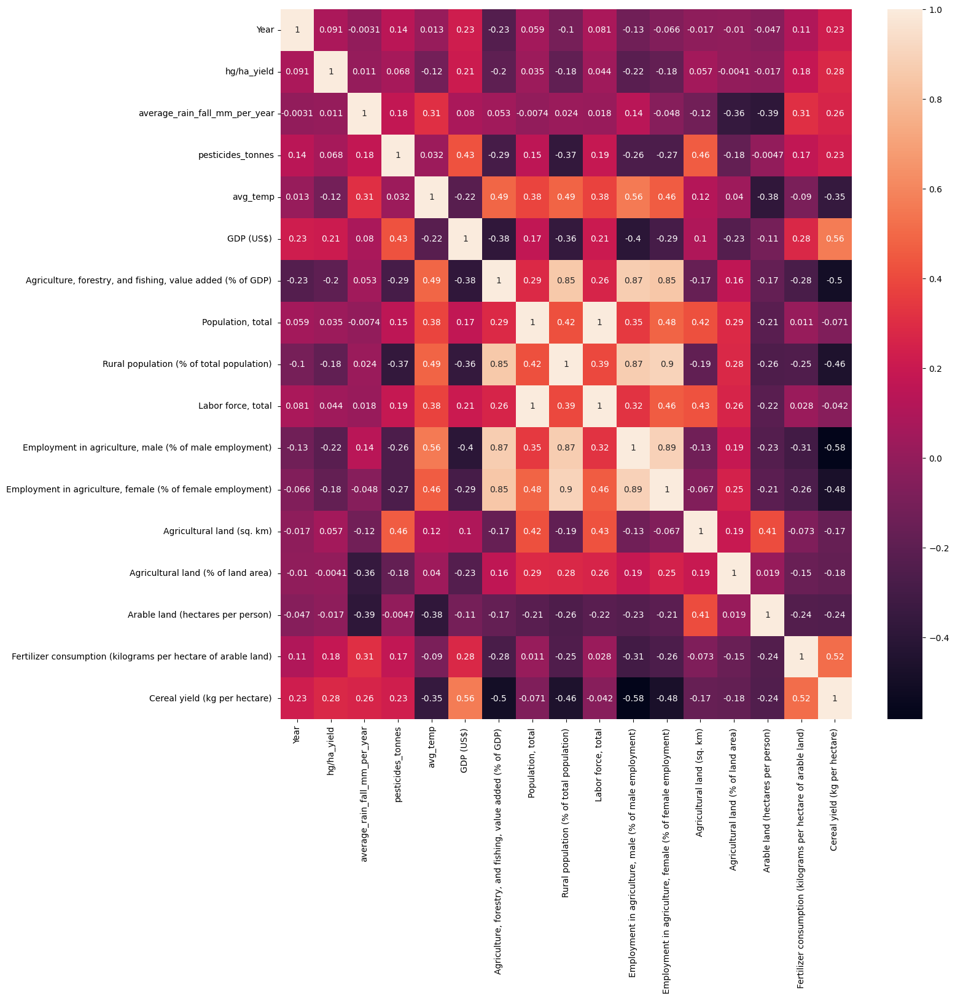

In [7]:
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(df.corr(),annot=True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27228 entries, 0 to 27227
Data columns (total 19 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   Country Name                                                    27228 non-null  object 
 1   Item                                                            27228 non-null  object 
 2   Year                                                            27228 non-null  int64  
 3   hg/ha_yield                                                     27228 non-null  int64  
 4   average_rain_fall_mm_per_year                                   27228 non-null  int64  
 5   pesticides_tonnes                                               27228 non-null  float64
 6   avg_temp                                                        27228 non-null  float64
 7   GDP (US$)                                        

In [9]:
df.describe().round(2)

,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,GDP (US$),"Agriculture, forestry, and fishing, value added (% of GDP)","Population, total",Rural population (% of total population),"Labor force, total","Employment in agriculture, male (% of male employment)","Employment in agriculture, female (% of female employment)",Agricultural land (sq. km),Agricultural land (% of land area),Arable land (hectares per person),Fertilizer consumption (kilograms per hectare of arable land),Cereal yield (kg per hectare)
count,27228.00,27228.00,27228.00,27228.00,27228.00,27159.00,26061.00,27228.00,27228.00,27228.00,26103.00,26103.00,27228.00,27228.00,27228.00,26713.00,27199.00
mean,2001.53,76489.74,1174.45,37602.39,20.64,605962263583.44,13.19,214863166.46,45.53,81216462.02,32.50,33.98,859842.57,45.49,0.29,125.62,2838.75
std,7.05,84767.92,707.49,60939.54,6.35,1015801146633.65,10.38,372000727.75,23.66,135060087.34,21.49,30.91,1027989.18,19.41,0.32,156.01,1510.09
min,1990.00,50.00,56.00,0.04,1.30,348533094.81,0.09,412756.00,1.22,126280.00,0.46,0.01,80.00,0.45,0.00,0.01,152.60
25%,1995.00,19387.25,608.00,1622.40,16.80,24432884442.22,4.17,12623342.00,23.08,5044501.00,14.28,5.86,80750.00,28.24,0.13,57.00,1891.20
50%,2001.00,37419.50,1083.00,16936.00,21.76,224383620829.57,9.90,41648268.00,43.90,18324356.00,32.21,20.48,363250.00,47.68,0.19,97.78,2580.40
75%,2008.00,105180.25,1668.00,49695.00,26.09,708756677088.63,21.61,173486281.00,68.92,68159606.00,48.94,68.01,1796980.00,60.56,0.28,156.50,3532.10
max,2013.00,501412.00,3240.00,367778.00,30.65,6272362996105.03,53.38,1291132063.00,94.58,476574158.00,91.57,96.85,4691430.00,85.49,2.19,2299.42,9710.00


In [10]:
df['Country Name'].nunique()

98

In [11]:
df['Item'].nunique()

10

The dataset is from the year 1990 to 2013 and consist of data from 98 countries. 10 different items (crops) are considered in the dataset.

Checking for null values

In [12]:
df.isna().sum()

Country Name                                                         0
Item                                                                 0
Year                                                                 0
hg/ha_yield                                                          0
average_rain_fall_mm_per_year                                        0
pesticides_tonnes                                                    0
avg_temp                                                             0
GDP (US$)                                                           69
Agriculture, forestry, and fishing, value added (% of GDP)        1167
Population, total                                                    0
Rural population (% of total population)                             0
Labor force, total                                                   0
Employment in agriculture, male (% of male employment)            1125
Employment in agriculture, female (% of female employment)        1125
Agricu

The amount of null values is very less (nearly 4% of the dataset). The same can be replaced with the mode of data if required.

Checking the frequnecy of each data

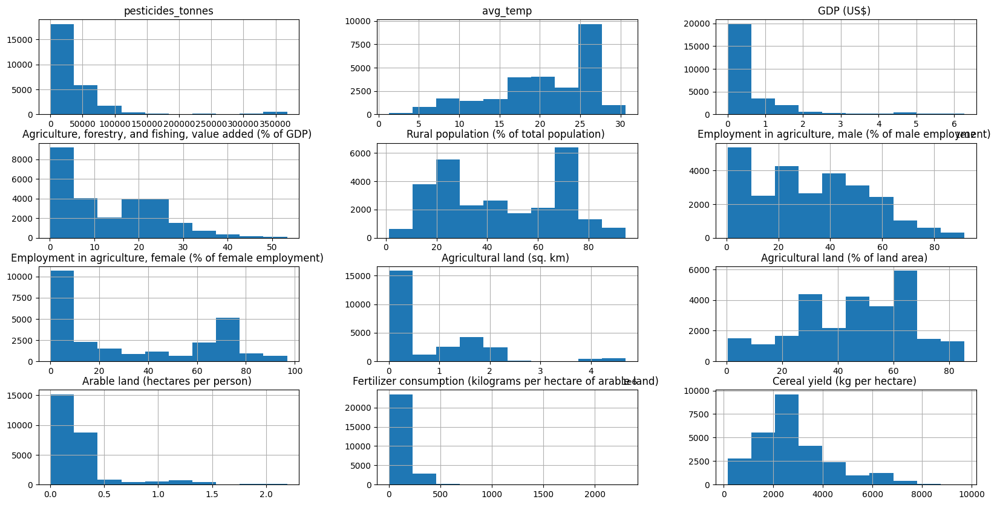

In [13]:
freqgraph=df.select_dtypes(include='float')
freqgraph.hist(figsize=(20,10))
plt.show()

Most of the data is skewed and not normally distributed

<Axes: >

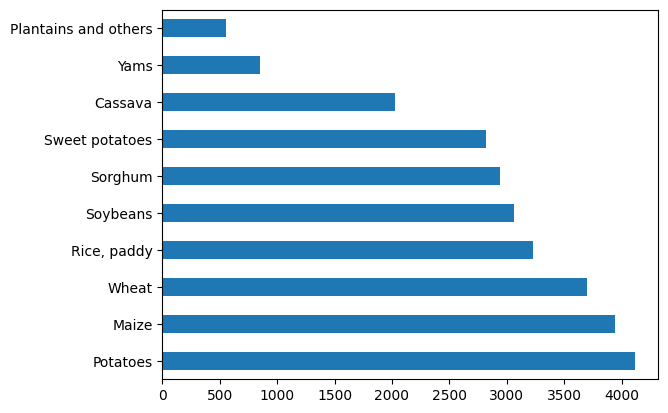

In [14]:
df['Item'].value_counts().plot(kind='barh')

Checking for duplicate columns

In [15]:
df.duplicated().sum()

2310

Removing the duplicate values

In [16]:
df2=df.drop_duplicates()

Checking the dataset size after removal of duplicate rows

In [17]:
df2.shape

(24918, 19)

Checking the item counts in total 

Text(0.5, 1.0, 'Count of different items')

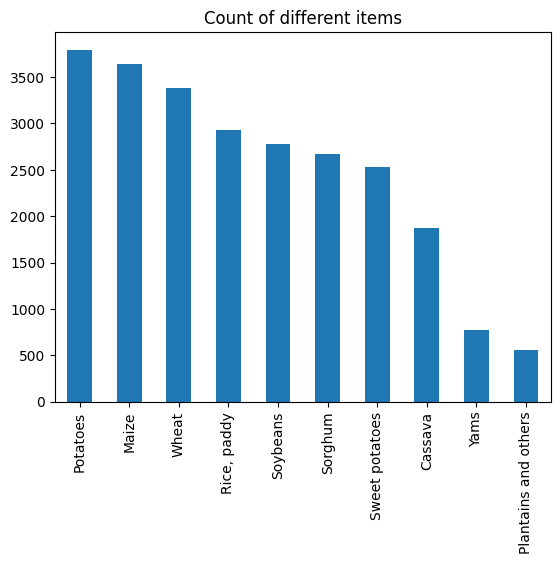

In [18]:
df2.Item.value_counts().plot(kind='bar')
plt.title('Count of different items')

Potato is the most cultivated crop in most of the countries

Text(0.5, 1.0, 'Count of data in each year')

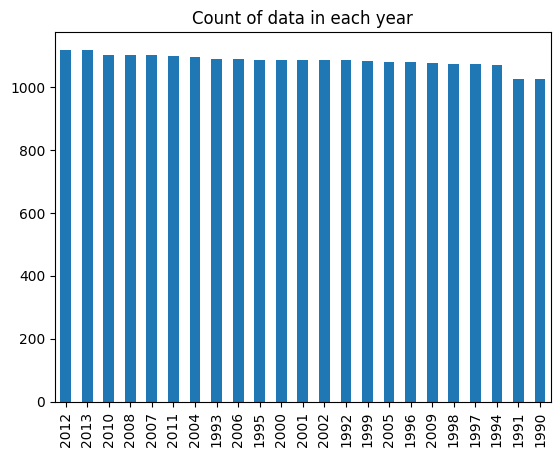

In [19]:
df2.Year.value_counts().plot(kind='bar')
plt.title('Count of data in each year')

The dataset is uniformily spread across the years

In [20]:
df2.dropna(inplace=True)

In [21]:
df2.isna().sum()

Country Name                                                      0
Item                                                              0
Year                                                              0
hg/ha_yield                                                       0
average_rain_fall_mm_per_year                                     0
pesticides_tonnes                                                 0
avg_temp                                                          0
GDP (US$)                                                         0
Agriculture, forestry, and fishing, value added (% of GDP)        0
Population, total                                                 0
Rural population (% of total population)                          0
Labor force, total                                                0
Employment in agriculture, male (% of male employment)            0
Employment in agriculture, female (% of female employment)        0
Agricultural land (sq. km)                      

In [22]:
df2.duplicated().sum()

0

In [23]:
df2.shape

(22435, 19)

In [24]:
df2.columns

Index(['Country Name', 'Item', 'Year', 'hg/ha_yield',
       'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp',
       'GDP (US$) ',
       'Agriculture, forestry, and fishing, value added (% of GDP) ',
       'Population, total ', 'Rural population (% of total population) ',
       'Labor force, total ',
       'Employment in agriculture, male (% of male employment) ',
       'Employment in agriculture, female (% of female employment) ',
       'Agricultural land (sq. km) ', 'Agricultural land (% of land area) ',
       'Arable land (hectares per person) ',
       'Fertilizer consumption (kilograms per hectare of arable land) ',
       'Cereal yield (kg per hectare) '],
      dtype='object')

In [25]:
type(df2)

pandas.core.frame.DataFrame

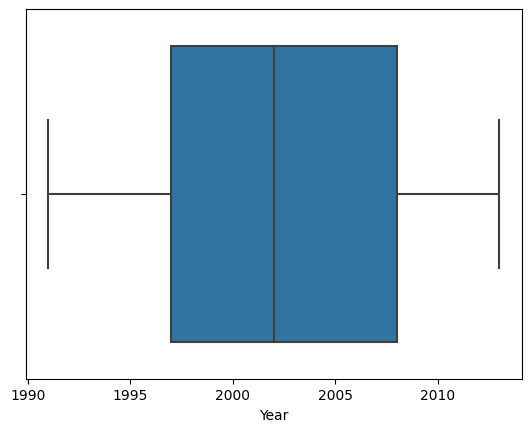

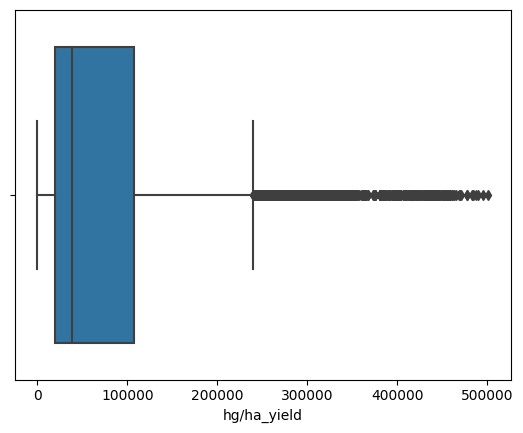

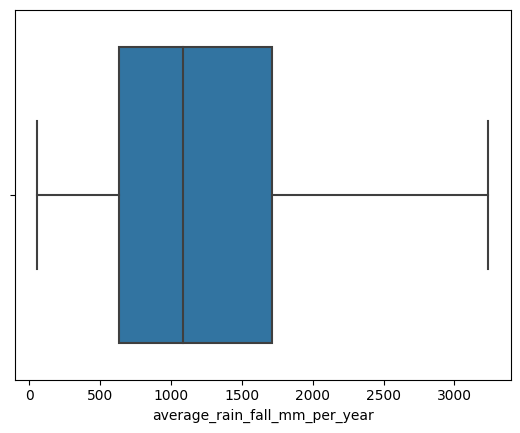

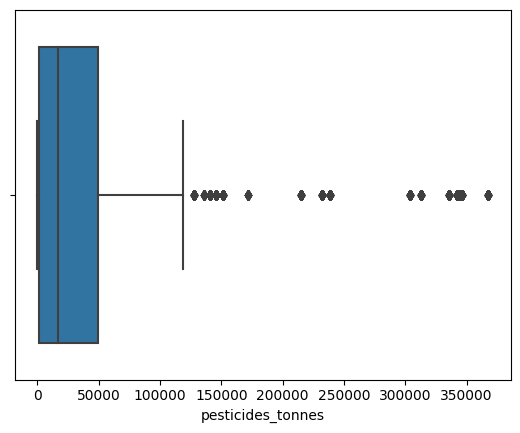

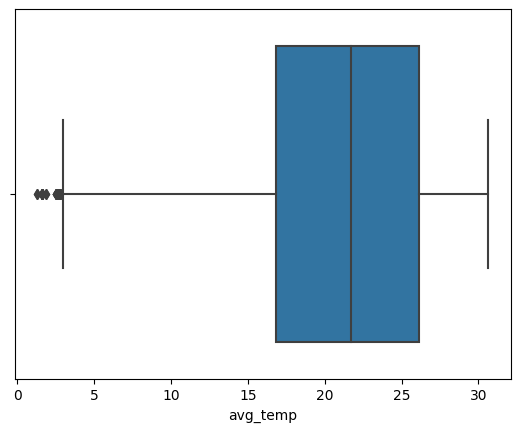

...

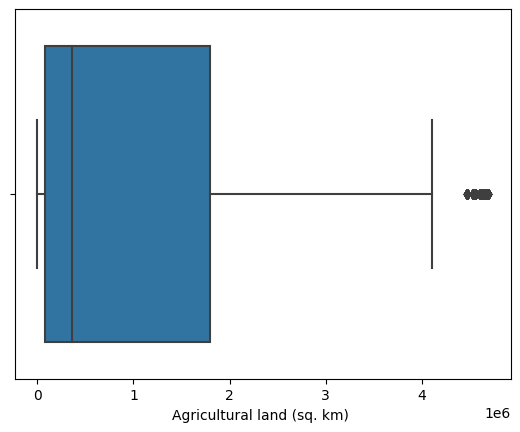

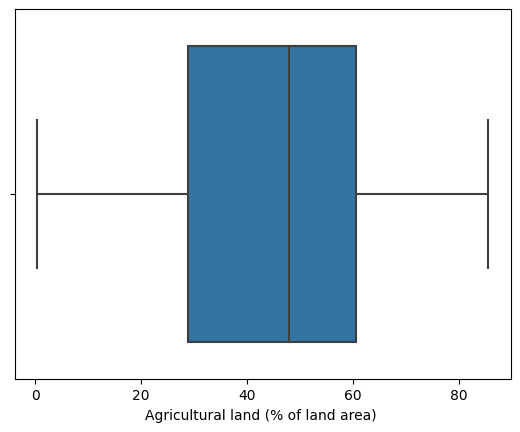

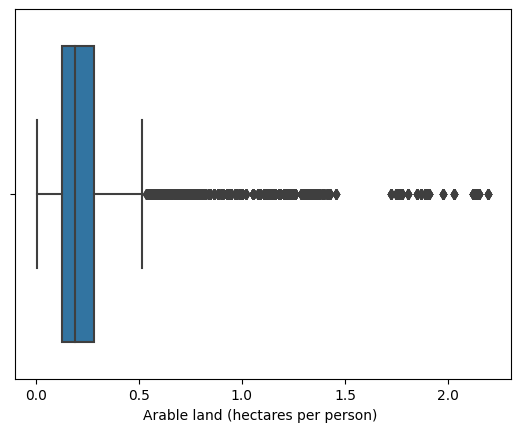

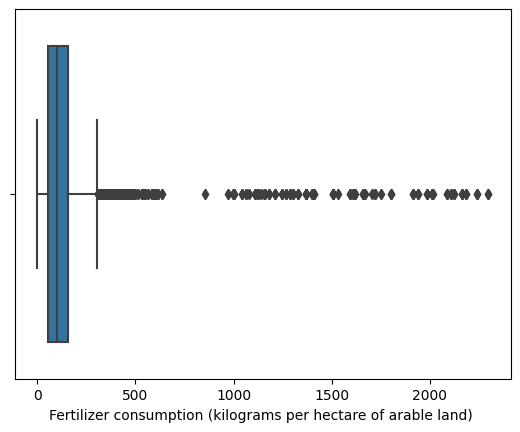

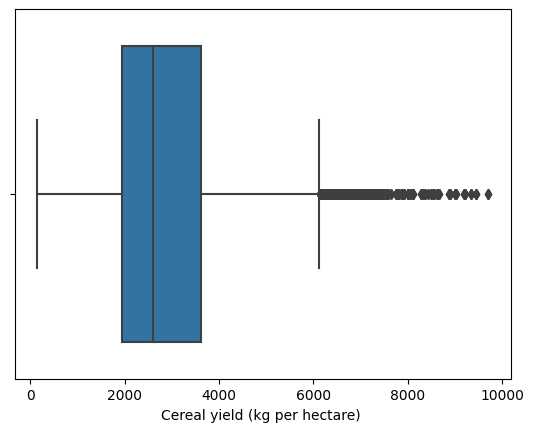

In [26]:
for i in ['Year', 'hg/ha_yield',
       'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp',
       'GDP (US$) ',
       'Agriculture, forestry, and fishing, value added (% of GDP) ',
       'Population, total ', 'Rural population (% of total population) ',
       'Labor force, total ',
       'Employment in agriculture, male (% of male employment) ',
       'Employment in agriculture, female (% of female employment) ',
       'Agricultural land (sq. km) ', 'Agricultural land (% of land area) ',
       'Arable land (hectares per person) ',
       'Fertilizer consumption (kilograms per hectare of arable land) ',
       'Cereal yield (kg per hectare) ']:
    sns.boxplot(x=df2[i])
    plt.show()

In [27]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22435 entries, 31 to 27227
Data columns (total 19 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   Country Name                                                    22435 non-null  object 
 1   Item                                                            22435 non-null  object 
 2   Year                                                            22435 non-null  int64  
 3   hg/ha_yield                                                     22435 non-null  int64  
 4   average_rain_fall_mm_per_year                                   22435 non-null  int64  
 5   pesticides_tonnes                                               22435 non-null  float64
 6   avg_temp                                                        22435 non-null  float64
 7   GDP (US$)                                       

Removing outliers

In [28]:
for i in ['Year', 'hg/ha_yield',
       'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp',
       'GDP (US$) ',
       'Agriculture, forestry, and fishing, value added (% of GDP) ',
       'Population, total ', 'Rural population (% of total population) ',
       'Labor force, total ',
       'Employment in agriculture, male (% of male employment) ',
       'Employment in agriculture, female (% of female employment) ',
       'Agricultural land (sq. km) ', 'Agricultural land (% of land area) ',
       'Arable land (hectares per person) ',
       'Fertilizer consumption (kilograms per hectare of arable land) ',
       'Cereal yield (kg per hectare) ']:
  IQR =stats.iqr(df2[i],interpolation='midpoint')
  IQR
  Q1=df2[i].quantile(0.25)
  Q3=df2[i].quantile(0.75)
  min_limit=Q1-1.5*IQR
  max_limit=Q3+1.5*IQR
  min_limit,max_limit
  df2.loc[df2[i]>max_limit,i]=np.median(df2[i])
  df2.loc[df2[i]<min_limit,i]=np.median(df2[i])

sns.relplot(data=df2,x='hg/ha_yield',y='Fertilizer consumption (kilograms per hectare of arable land) ')

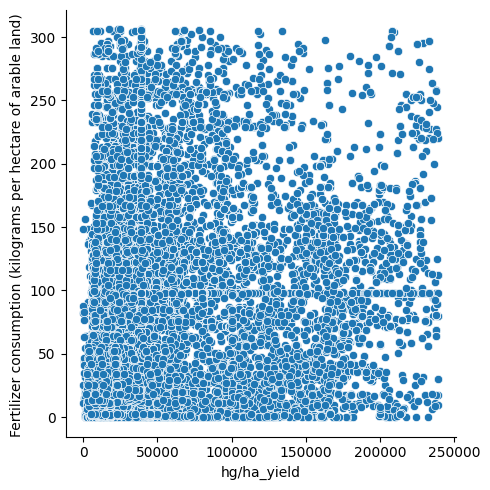

In [29]:
sns.relplot(data=df2,x='hg/ha_yield',y='Fertilizer consumption (kilograms per hectare of arable land) ')

sns.relplot(data=df2,x='hg/ha_yield',y='Agriculture, forestry, and fishing, value added (% of GDP) ',row='Country Name')

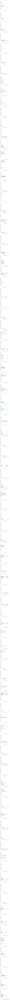

In [30]:
sns.relplot(data=df2,x='hg/ha_yield',y='Agriculture, forestry, and fishing, value added (% of GDP) ',row='Country Name')

Year Vs Yield Graphs on Country

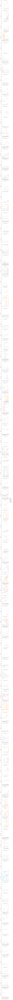

In [31]:
sns.relplot(data=df2,y='hg/ha_yield',x='Year',row='Country Name',kind='line',hue='Item',legend='full')

Male employment Vs Year

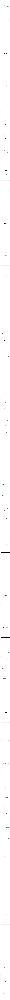

In [32]:
sns.relplot(data=df2,y='Employment in agriculture, male (% of male employment) ',x='Year',row='Country Name',kind='line',legend='full')

Cereal yield Vs Year

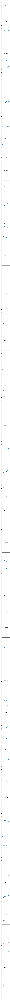

In [33]:
sns.relplot(data=df2,y='Cereal yield (kg per hectare) ',x='Year',row='Country Name',kind='line',legend='full')

In [34]:
df2.shape

(22435, 19)

Grouping data by country and item

In [35]:
df3=df2.sort_values(['Country Name','Item'])

In [36]:
df3.head(10)

,Country Name,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,GDP (US$),"Agriculture, forestry, and fishing, value added (% of GDP)","Population, total",Rural population (% of total population),"Labor force, total","Employment in agriculture, male (% of male employment)","Employment in agriculture, female (% of female employment)",Agricultural land (sq. km),Agricultural land (% of land area),Arable land (hectares per person),Fertilizer consumption (kilograms per hectare of arable land),Cereal yield (kg per hectare)
31,Albania,Maize,1996,32604,1485,313.96,15.64,3199641335.94,36.41,3168033,60.53,1343448,49.00,64.84,11310.00,41.28,0.18,11.27,2450.90
35,Albania,Maize,1997,31862,1485,376.93,15.90,2258513974.10,31.54,3148281,59.97,1360590,48.72,65.49,11350.00,41.42,0.18,9.00,2833.30
39,Albania,Maize,1998,33416,1485,439.89,16.27,2545964540.88,28.79,3128530,59.40,1344921,47.94,65.02,11390.00,41.57,0.18,43.33,2872.10
43,Albania,Maize,1999,37455,1485,502.86,16.57,3212121650.98,25.92,3108778,58.83,1325723,46.31,64.75,11450.00,41.79,0.19,18.37,2798.10
47,Albania,Maize,2000,38811,1485,565.82,16.67,3480355258.04,24.52,3089027,58.26,1317402,44.92,63.98,11440.00,41.75,0.19,32.35,3175.10
51,Albania,Maize,2001,38135,1485,628.79,16.59,3922100793.54,22.72,3060173,57.56,1304704,42.96,63.20,11390.00,41.57,0.19,32.35,3030.80
55,Albania,Maize,2002,39460,1485,691.75,16.47,4348068242.20,22.03,3051010,56.50,1308103,41.70,62.19,11400.00,41.61,0.19,97.58,3291.90
59,Albania,Maize,2004,46197,1485,817.68,16.16,7184685781.52,20.54,3026939,54.35,1281167,39.78,60.35,11220.00,40.95,0.19,101.31,3466.30
63,Albania,Maize,2005,45442,1485,880.64,15.67,8052073539.38,18.85,3011487,53.27,1266464,38.56,59.66,10770.00,39.31,0.18,112.38,3462.10
67,Albania,Maize,2006,50111,1485,943.61,15.92,8896072918.98,17.71,2992547,52.19,1249959,37.43,58.54,11200.00,40.88,0.20,85.80,3602.60


In [37]:
df2=df3
df2.head()

,Country Name,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,GDP (US$),"Agriculture, forestry, and fishing, value added (% of GDP)","Population, total",Rural population (% of total population),"Labor force, total","Employment in agriculture, male (% of male employment)","Employment in agriculture, female (% of female employment)",Agricultural land (sq. km),Agricultural land (% of land area),Arable land (hectares per person),Fertilizer consumption (kilograms per hectare of arable land),Cereal yield (kg per hectare)
31,Albania,Maize,1996,32604,1485,313.96,15.64,3199641335.94,36.41,3168033,60.53,1343448,49.00,64.84,11310.00,41.28,0.18,11.27,2450.90
35,Albania,Maize,1997,31862,1485,376.93,15.90,2258513974.10,31.54,3148281,59.97,1360590,48.72,65.49,11350.00,41.42,0.18,9.00,2833.30
39,Albania,Maize,1998,33416,1485,439.89,16.27,2545964540.88,28.79,3128530,59.40,1344921,47.94,65.02,11390.00,41.57,0.18,43.33,2872.10
43,Albania,Maize,1999,37455,1485,502.86,16.57,3212121650.98,25.92,3108778,58.83,1325723,46.31,64.75,11450.00,41.79,0.19,18.37,2798.10
47,Albania,Maize,2000,38811,1485,565.82,16.67,3480355258.04,24.52,3089027,58.26,1317402,44.92,63.98,11440.00,41.75,0.19,32.35,3175.10


Label encoding the country name

In [38]:
le1 = LabelEncoder()
df2['Country Name']= le1.fit_transform(df2['Country Name'])
df2.head()

,Country Name,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,GDP (US$),"Agriculture, forestry, and fishing, value added (% of GDP)","Population, total",Rural population (% of total population),"Labor force, total","Employment in agriculture, male (% of male employment)","Employment in agriculture, female (% of female employment)",Agricultural land (sq. km),Agricultural land (% of land area),Arable land (hectares per person),Fertilizer consumption (kilograms per hectare of arable land),Cereal yield (kg per hectare)
31,0,Maize,1996,32604,1485,313.96,15.64,3199641335.94,36.41,3168033,60.53,1343448,49.00,64.84,11310.00,41.28,0.18,11.27,2450.90
35,0,Maize,1997,31862,1485,376.93,15.90,2258513974.10,31.54,3148281,59.97,1360590,48.72,65.49,11350.00,41.42,0.18,9.00,2833.30
39,0,Maize,1998,33416,1485,439.89,16.27,2545964540.88,28.79,3128530,59.40,1344921,47.94,65.02,11390.00,41.57,0.18,43.33,2872.10
43,0,Maize,1999,37455,1485,502.86,16.57,3212121650.98,25.92,3108778,58.83,1325723,46.31,64.75,11450.00,41.79,0.19,18.37,2798.10
47,0,Maize,2000,38811,1485,565.82,16.67,3480355258.04,24.52,3089027,58.26,1317402,44.92,63.98,11440.00,41.75,0.19,32.35,3175.10


Label encoding the items

In [39]:
le2 = LabelEncoder()
df2['Item']= le2.fit_transform(df2['Item'])

df2.head()

,Country Name,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,GDP (US$),"Agriculture, forestry, and fishing, value added (% of GDP)","Population, total",Rural population (% of total population),"Labor force, total","Employment in agriculture, male (% of male employment)","Employment in agriculture, female (% of female employment)",Agricultural land (sq. km),Agricultural land (% of land area),Arable land (hectares per person),Fertilizer consumption (kilograms per hectare of arable land),Cereal yield (kg per hectare)
31,0,1,1996,32604,1485,313.96,15.64,3199641335.94,36.41,3168033,60.53,1343448,49.00,64.84,11310.00,41.28,0.18,11.27,2450.90
35,0,1,1997,31862,1485,376.93,15.90,2258513974.10,31.54,3148281,59.97,1360590,48.72,65.49,11350.00,41.42,0.18,9.00,2833.30
39,0,1,1998,33416,1485,439.89,16.27,2545964540.88,28.79,3128530,59.40,1344921,47.94,65.02,11390.00,41.57,0.18,43.33,2872.10
43,0,1,1999,37455,1485,502.86,16.57,3212121650.98,25.92,3108778,58.83,1325723,46.31,64.75,11450.00,41.79,0.19,18.37,2798.10
47,0,1,2000,38811,1485,565.82,16.67,3480355258.04,24.52,3089027,58.26,1317402,44.92,63.98,11440.00,41.75,0.19,32.35,3175.10


In [40]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22435 entries, 31 to 27227
Data columns (total 19 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   Country Name                                                    22435 non-null  int64  
 1   Item                                                            22435 non-null  int64  
 2   Year                                                            22435 non-null  int64  
 3   hg/ha_yield                                                     22435 non-null  int64  
 4   average_rain_fall_mm_per_year                                   22435 non-null  int64  
 5   pesticides_tonnes                                               22435 non-null  float64
 6   avg_temp                                                        22435 non-null  float64
 7   GDP (US$)                                       

Creating the dependent and independent variables

In [41]:
x=df2.drop('hg/ha_yield',axis=1)
y=df2['hg/ha_yield']

Train and Test variables

In [42]:
x_train,x_test,y_train,y_test=train_test_split(x,y,train_size=0.3,random_state=42)

Using Standard Scaler

In [43]:
std_scaler=StandardScaler()

In [44]:
x1=std_scaler.fit_transform(x)
x1=pd.DataFrame(x1,columns=x.columns)

In [45]:
x_train1,x_test1,y_train1,y_test1=train_test_split(x1,y,train_size=0.3,random_state=42)

Using Min Max Scaler

In [46]:
min_scaler=MinMaxScaler()

In [47]:
x2=min_scaler.fit_transform(x)
x2=pd.DataFrame(x2,columns=x.columns)

In [48]:
x_train2,x_test2,y_train2,y_test2=train_test_split(x2,y,train_size=0.3,random_state=42)

Testing without scaling

In [49]:
value= [LinearRegression(),LogisticRegression(), BaggingRegressor(), DecisionTreeRegressor(),ExtraTreesRegressor(),GradientBoostingRegressor(),HistGradientBoostingRegressor()]
key= ['Linear Regression','Logistic Regression', 'Bagging Regression',   'Decision Tree Regression','Extra Trees Regression','Gradient Boosting Regression','Hist Gradient Boosting Regression']

models= dict(zip(key,value))
for key,value in models.items():
    value.fit(x_train,y_train)
    y_pred= value.predict(x_test).round(0)
    print('\n',key)
    print('  Mean square error = ',mean_squared_error(y_test,y_pred))
    print('  R2 Score =',r2_score(y_test,y_pred))


 Linear Regression
  Mean square error =  3003724858.544731
  R2 Score = 0.052868045465979896

 Logistic Regression
  Mean square error =  3600994695.6080866
  R2 Score = -0.13546256895524356

 Bagging Regression
  Mean square error =  334607443.4262337
  R2 Score = 0.894491866992284

 Decision Tree Regression
  Mean square error =  502350850.1307227
  R2 Score = 0.84159915939283

 Extra Trees Regression
  Mean square error =  237707970.58656478
  R2 Score = 0.9250461259294414

 Gradient Boosting Regression
  Mean square error =  907093749.0678128
  R2 Score = 0.7139759745117162

 Hist Gradient Boosting Regression
  Mean square error =  396608444.56491566
  R2 Score = 0.8749417643174351


Testing after StandardScaler

In [50]:
value= [LinearRegression(),LogisticRegression(), BaggingRegressor(), DecisionTreeRegressor(),ExtraTreesRegressor(),GradientBoostingRegressor(),HistGradientBoostingRegressor()]
key= ['Linear Regression','Logistic Regression', 'Bagging Regression',   'Decision Tree Regression','Extra Trees Regression','Gradient Boosting Regression','Hist Gradient Boosting Regression']

models= dict(zip(key,value))
for key,value in models.items():
    value.fit(x_train1,y_train1)
    y_pred1= value.predict(x_test1).round(0)
    print('\n',key)
    print('  Mean square error = ',mean_squared_error(y_test1,y_pred1))
    print('  R2 Score =',r2_score(y_test1,y_pred1))


 Linear Regression
  Mean square error =  3003725205.7778416
  R2 Score = 0.05286793597673234

 Logistic Regression
  Mean square error =  4224868497.3957977
  R2 Score = -0.33218192278981684

 Bagging Regression
  Mean square error =  322187649.1674626
  R2 Score = 0.8984080659003689

 Decision Tree Regression
  Mean square error =  470750648.9290035
  R2 Score = 0.8515633078209764

 Extra Trees Regression
  Mean square error =  236600674.5956065
  R2 Score = 0.9253952775546911

 Gradient Boosting Regression
  Mean square error =  907670057.7507163
  R2 Score = 0.7137942533505053

 Hist Gradient Boosting Regression
  Mean square error =  396608444.56491566
  R2 Score = 0.8749417643174351


Testing after MinMaxScaler

In [ ]:
value= [LinearRegression(),LogisticRegression(), BaggingRegressor(), DecisionTreeRegressor(),ExtraTreesRegressor(),GradientBoostingRegressor(),HistGradientBoostingRegressor()]
key= ['Linear Regression','Logistic Regression', 'Bagging Regression',   'Decision Tree Regression','Extra Trees Regression','Gradient Boosting Regression','Hist Gradient Boosting Regression']

models= dict(zip(key,value))
for key,value in models.items():
    value.fit(x_train2,y_train2)
    y_pred2= value.predict(x_test2).round(0)
    print('\n',key)
    print('  Mean square error = ',mean_squared_error(y_test2,y_pred2))
    print('  R2 Score =',r2_score(y_test2,y_pred2))

Defining Bagging Regression

In [52]:
BR = BaggingRegressor()
BR.fit(x_train,y_train)
pred_BR=BR.predict(x_test)
print('  Mean square error = ',mean_squared_error(y_test,pred_BR))
print('  R2 Score =',r2_score(y_test,pred_BR))

  Mean square error =  293784160.2491748
  R2 Score = 0.9073642297441495


Defining Decision Tree Regression

In [ ]:
DT = DecisionTreeRegressor()
DT.fit(x_train,y_train)
pred_DT=DT.predict(x_test)
print('  Mean square error = ',mean_squared_error(y_test,pred_DT))
print('  R2 Score =',r2_score(y_test,pred_DT))

Defining Gradient boosting Regression

In [54]:
GBR = GradientBoostingRegressor()
GBR.fit(x_train,y_train)
pred_GBR=GBR.predict(x_test)
print('  Mean square error = ',mean_squared_error(y_test,pred_GBR))
print('  R2 Score =',r2_score(y_test,pred_GBR))

  Mean square error =  907247542.4562176
  R2 Score = 0.7139274805119613


Defining Hist Gradient boosting Regression

In [55]:
HGBR = HistGradientBoostingRegressor()
HGBR.fit(x_train,y_train)
pred_HGBR=HGBR.predict(x_test)
print('  Mean square error = ',mean_squared_error(y_test,pred_HGBR))
print('  R2 Score =',r2_score(y_test,pred_HGBR))

  Mean square error =  396608441.53978616
  R2 Score = 0.8749417652713163


Defining the Extra Tree Regressor

In [56]:
ETR = ExtraTreesRegressor()
ETR.fit(x_train,y_train)
pred_ETR=ETR.predict(x_test)
print('  Mean square error = ',mean_squared_error(y_test,pred_ETR))
print('  R2 Score =',r2_score(y_test,pred_ETR))

  Mean square error =  239144332.3531552
  R2 Score = 0.9245932135651351


Stratified cross validation Extra Tress regression

In [57]:
Skfold=StratifiedKFold(n_splits=15)
cv_result=cross_val_score(ETR,x,y,cv= Skfold)
np.mean(cv_result)

0.799989339023944

In [ ]:
Skfold=StratifiedKFold(n_splits=25)
cv_result=cross_val_score(ETR,x,y,cv= Skfold)
np.mean(cv_result)

In [ ]:
Skfold=StratifiedKFold(n_splits=35)
cv_result=cross_val_score(ETR,x,y,cv= Skfold)
np.mean(cv_result)

As the number of folds increases the accuracy also increases

Stratified cross validation Bagging Regressor

In [ ]:
Skfold_br=StratifiedKFold(n_splits=10)
cv_result_br=cross_val_score(BR,x,y,scoring='r2',cv= Skfold_br)
np.mean(cv_result_br)

Stratified cross validation Decision Tree Regressor

In [ ]:
Skfold_dt=StratifiedKFold(n_splits=10)
cv_result_dt=cross_val_score(DT,x,y,cv= Skfold_dt)
np.mean(cv_result_dt)

Stratified cross validation Gradient boosting Regression

In [ ]:
Skfold_gbr=StratifiedKFold(n_splits=10)
cv_result_gbr=cross_val_score(GBR,x,y,cv= Skfold_gbr)
np.mean(cv_result_gbr)

Stratified cross validation Hist Gradient boosting Regression

In [ ]:
Skfold_hgbr=StratifiedKFold(n_splits=10)
cv_result_hgbr=cross_val_score(HGBR,x,y,cv= Skfold_hgbr)
np.mean(cv_result_hgbr)